<a href="https://www.kaggle.com/code/thirumani/shark-tank-us-data-analysis?scriptVersionId=172969002" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## <p style="background-color:#800080;color:white;font-size:24px;text-align:center;border-radius:10px 10px;font-weight:bold;border:2px solid #800080;">SharkTank US Exploratory Data Analysis (EDA)</p>
## Dataset https://www.kaggle.com/datasets/thirumani/shark-tank-us-dataset

In [1]:
from IPython.display import IFrame
import datetime
print("Notebook was last executed on:", datetime.date.today().strftime("%Y-%b-%d"), "with Python version")
!python --version

Notebook was last executed on: 2024-Apr-20 with Python version
Python 3.10.13


In [2]:
# Source: Wikipedia
IFrame('https://upload.wikimedia.org/wikipedia/en/6/68/Shark_Tank_Logo.jpg', width=360, height=270)

## ⚒️ Importing Required Python Libraries

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

import matplotlib.pyplot as plt
import seaborn as sns
from babel.numbers import format_currency
from wordcloud import WordCloud, STOPWORDS
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_dark"
pio.renderers.default = 'notebook'

## ⏳ Check and import dataset

In [4]:
! ls -l /kaggle/input/shark-tank-us-dataset
shark_tank = pd.read_csv('/kaggle/input/shark-tank-us-dataset/Shark Tank US dataset.csv', encoding = "ISO-8859-1")

nRow, nCol = shark_tank.shape
print(f'\nThere are {nRow} rows and {nCol} columns in the dataset')

total 304
-rw-r--r-- 1 nobody nogroup 308725 Apr 20 05:40 'Shark Tank US dataset.csv'

There are 1353 rows and 53 columns in the dataset


## 💵 Exploratory Data Analysis (EDA)

In [5]:
shark_tank.head(5)

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Advisory Shares Equity,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present
0,1,AvaTheElephant,1,1,9-Aug-09,5-Feb-10,9-Aug-09,Health/Wellness,Ava The Elephant - Baby and Child Care,http://www.avatheelephant.com/,Female,Atlanta,GA,NaN,Tiffany Krumins,0.0,4.15,50000,15.0,333333,1,50000.0,55.0,90909.0,1.0,...,NaN,NaN,NaN,50000.0,55.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,1.0,1.0,1.0,NaN
1,1,Mr.Tod'sPieFactory,1,2,9-Aug-09,5-Feb-10,9-Aug-09,Food and Beverage,Mr. Tod's Pie Factory - Specialty Food,http://whybake.com/,Male,Somerset,NJ,NaN,Tod Wilson,0.0,4.15,460000,10.0,4600000,1,460000.0,50.0,920000.0,2.0,...,NaN,NaN,NaN,230000.0,25.0,NaN,NaN,NaN,NaN,NaN,NaN,230000.0,25.0,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,1.0,1.0,1.0,NaN
2,1,Wispots,1,3,9-Aug-09,5-Feb-10,9-Aug-09,Business Services,Wispots - Consumer Services,http://www.wispots.com/,Male,Cary,NC,NaN,Kevin Flannery,0.0,4.15,1200000,10.0,12000000,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,1.0,1.0,1.0,NaN
3,1,CollegeFoxesPackingBoxes,1,4,9-Aug-09,5-Feb-10,9-Aug-09,Lifestyle/Home,College Foxes Packing Boxes - Consumer Services,http://collegehunkshaulingjunk.com/,Male,Tampa,FL,NaN,"Nick Friedman, Omar Soliman",0.0,4.15,250000,25.0,1000000,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,1.0,1.0,1.0,NaN
4,1,IonicEar,1,5,9-Aug-09,5-Feb-10,9-Aug-09,Software/Tech,Ionic Ear - Novelties,NaN,Male,St. Paul,MN,NaN,Darrin Johnson,0.0,4.15,1000000,15.0,6666667,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,1.0,1.0,1.0,NaN


In [6]:
shark_tank.tail(10).T

,1343,1344,1345,1346,1347,1348,1349,1350,1351,1352
Season Number,15,15,15,15,15,15,15,15,15,15
Startup Name,Overplay,Nourish+Bloom,Splash,Hibear,Veba,Richaulist,VSEAT,SorSoap,Wedy,Blinger
Episode Number,18,18,19,19,19,19,20,20,20,20
Pitch Number,1344,1345,1346,1347,1348,1349,1350,1351,1352,1353
Season Start,29-Sep-23,29-Sep-23,29-Sep-23,29-Sep-23,29-Sep-23,29-Sep-23,29-Sep-23,29-Sep-23,29-Sep-23,29-Sep-23
Season End,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Original Air Date,15-Mar-24,15-Mar-24,5-Apr-24,5-Apr-24,5-Apr-24,5-Apr-24,12-Apr-24,12-Apr-24,12-Apr-24,12-Apr-24
Industry,Software/Tech,Lifestyle/Home,Lifestyle/Home,Lifestyle/Home,Children/Education,Fashion/Beauty,Fitness/Sports/Outdoors,Fitness/Sports/Outdoors,Business Services,Fashion/Beauty
Business Description,App for video game creation,Autonomous grocery store,Swim Goggles,Insulated Flask,Baby Bottle monitor,Curly Hair Tool,Bicycle seat,Muscle soap,Wedding Planning App,Hair tool gems
Company Website,https://overplay.com/,https://www.nourishandbloommarket.com/,https://splashswimgoggles.com/,https://hibear.co/,https://vebababy.com/,https://richualist.com/,https://thevseat.com/,https://www.sorsoap.com/,https://www.wedyapp.com/,https://blinger.com/


In [7]:
shark_tank['Season Number'] = shark_tank['Season Number'].astype(pd.Int32Dtype())
shark_tank['Episode Number'] = shark_tank['Episode Number'].astype(pd.Int32Dtype())
shark_tank['Pitch Number'] = shark_tank['Pitch Number'].astype(pd.Int32Dtype())

shark_tank['Startup Name'] = shark_tank['Startup Name'].astype(str)
shark_tank['Industry'] = shark_tank['Industry'].astype(str)
shark_tank['Business Description'] = shark_tank['Business Description'].astype(str)

shark_tank['Multiple Entrepreneurs'] = shark_tank['Multiple Entrepreneurs'].astype(pd.Int32Dtype())

In [8]:
shark_tank.sample(10).style.set_properties(**{"background-color": "#2a9d8f","color":"white","border": "1px solid black", 'font-size': '10pt'})

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,Investment Amount Per Shark,Equity Per Shark,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present
950,11,CoconutGirl,14,951,29-Sep-19,15-May-20,6-Mar-20,Food and Beverage,Coconut Girl -,nan,Female,nan,nan,nan,nan,,4.340000,180000,18.000000,1000000,1,180000.000000,20.000000,900000.000000,1.000000,180000.000000,20.000000,nan,nan,nan,nan,nan,nan,180000.000000,20.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
961,11,CritterPricker,17,962,29-Sep-19,15-May-20,27-Mar-20,Lifestyle/Home,Critter Pricker -,nan,Male,nan,nan,nan,nan,,5.270000,115000,15.000000,766667,1,115000.000000,15.000000,766667.000000,1.000000,115000.000000,15.000000,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,115000.000000,15.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1332,15,Coldest,15,1333,29-Sep-23,nan,23-Feb-24,Lifestyle/Home,Cooling products,https://coldest.com/,Male,nan,FL,Middle,David Stark and Joe Wayne,1,3.520000,600000,2.000000,30000000,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan
1185,13,AquaBoxingGloves,24,1186,8-Oct-21,20-May-22,20-May-22,Fitness/Sports/Outdoors,Portable training gloves for boxers,nan,Male,nan,nan,Middle,Tony Adeniran,0,3.590000,100000,10.000000,1000000,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1342,15,TheMurderMysteryCo,18,1343,29-Sep-23,nan,15-Mar-24,Uncertain/Other,Murder mystery parties,https://www.murdermysteryco.com/,Male,nan,nan,Middle,Scott Cramton,0,3.020000,350000,5.000000,7000000,1,350000.000000,10.000000,3500000.000000,1.000000,350000.000000,10.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,350000.000000,10.000000,Jason Blum,1.000000,1.000000,1.000000,nan,nan,1.000000,1.000000
642,8,Toor,8,643,23-Sep-16,12-May-17,11-Nov-16,Lifestyle/Home,lockbox connected to an app,nan,Male,nan,TX,Middle,Junior Desinor,0,5.430000,500000,10.000000,5000000,1,500000.000000,10.000000,5000000.000000,2.000000,250000.000000,5.000000,nan,nan,300000.000000,nan,250000.000000,5.000000,nan,nan,nan,nan,nan,nan,nan,nan,250000.000000,5.000000,nan,nan,nan,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,nan
1146,13,Junobie,14,1147,8-Oct-21,20-May-22,25-Feb-22,Food and Beverage,Reusable breast milk storage bags,nan,Female,nan,nan,Middle,Nikeytha âNickeyâ Ramsey,0,3.450000,100000,10.000000,1000000,1,100000.000000,22.500000,444444.000000,1.000000,100000.000000,22.500000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,100000.000000,22.500000,Emma Grede,nan,nan,nan,nan,nan,nan,nan
44,1,TheBobblePlace,10,45,9-Aug-09,5-Feb-10,20-Oct-09,Children/Education,The Bobble Place - Toys and Games,http://www.webobble.com/,Male,Tampa,FL,nan,Jeff Wolsky,0,5.920000,75000,18.000000,416667,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.00

In [9]:
shark_tank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1353 entries, 0 to 1352
Data columns (total 53 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Season Number                       1353 non-null   Int32  
 1   Startup Name                        1353 non-null   object 
 2   Episode Number                      1353 non-null   Int32  
 3   Pitch Number                        1353 non-null   Int32  
 4   Season Start                        1353 non-null   object 
 5   Season End                          1274 non-null   object 
 6   Original Air Date                   1353 non-null   object 
 7   Industry                            1353 non-null   object 
 8   Business Description                1353 non-null   object 
 9   Company Website                     595 non-null    object 
 10  Pitchers Gender                     1346 non-null   object 
 11  Pitchers City                       529 non

In [10]:
shark_tank.describe().T.round(2).style.background_gradient(cmap = 'Oranges')

,count,mean,std,min,25%,50%,75%,max
Season Number,1353.000000,8.333333,3.977067,1.000000,5.000000,8.000000,12.000000,15.000000
Episode Number,1353.000000,12.403548,7.402705,1.000000,6.000000,12.000000,18.000000,29.000000
Pitch Number,1353.000000,677.000000,390.721768,1.000000,339.000000,677.000000,1015.000000,1353.000000
Multiple Entrepreneurs,926.000000,0.457883,0.498492,0.000000,0.000000,0.000000,1.000000,1.000000
US Viewership,1349.000000,5.042320,1.495874,2.270000,3.760000,4.680000,6.200000,8.640000
Original Ask Amount,1353.000000,282532.150776,353946.660947,10000.000000,100000.000000,200000.000000,325000.000000,5000000.000000
Original Offered Equity,1353.000000,13.525351,8.536381,1.000000,10.000000,10.000000,20.000000,100.000000
Valuation Requested,1353.000000,3562978.466371,5810881.334110,40000.000000,666667.000000,1600000.000000,4000000.000000,100000000.000000
Got Deal,1353.000000,0.605322,0.488962,0.000000,0.000000,1.000000,1.000000,1.000000
Total Deal Amount,819.000000,291920.837607,350125.141319,10000.000000,100000.000000,200000.000000,337500.000000,5000000.000000


In [11]:
# Unique values in each column
for col in shark_tank.columns:
    print("Number of unique values in", col, "-", shark_tank[col].nunique())

Number of unique values in Season Number - 15
Number of unique values in Startup Name - 1350
Number of unique values in Episode Number - 29
Number of unique values in Pitch Number - 1353
Number of unique values in Season Start - 15
Number of unique values in Season End - 14
Number of unique values in Original Air Date - 326
Number of unique values in Industry - 16
Number of unique values in Business Description - 1351
Number of unique values in Company Website - 593
Number of unique values in Pitchers Gender - 3
Number of unique values in Pitchers City - 259
Number of unique values in Pitchers State - 47
Number of unique values in Pitchers Average Age - 3
Number of unique values in Entrepreneur Names - 853
Number of unique values in Multiple Entrepreneurs - 2
Number of unique values in US Viewership - 230
Number of unique values in Original Ask Amount - 78
Number of unique values in Original Offered Equity - 46
Number of unique values in Valuation Requested - 176
Number of unique value

In [12]:
# Latest/current season data
shark_tank_recent = shark_tank.loc[(shark_tank['Season Number']==15)]

In [13]:
# Data set information
print(shark_tank['Season Number'].max(), "total seasons in US SharkTank\n")
print(shark_tank['Pitch Number'].max(), "#startups came for pitching \n")

15 total seasons in US SharkTank

1353 #startups came for pitching 



Season Number   1   2   3   4   5   6   7   8   9   10  11  12  13  14  15
Episode Number  14   9  15  26  29  29  29  24  24  23  24  25  24  22  20


([], [])

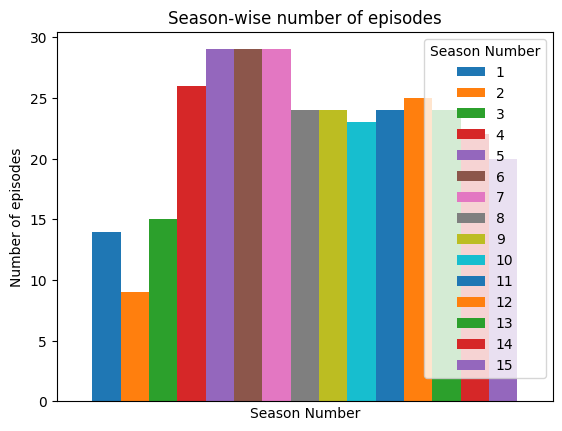

In [14]:
# Season-wise number of episodes
tmp = pd.pivot_table(shark_tank, values='Episode Number', columns='Season Number', aggfunc='max')
print(tmp)
tmp.plot(kind='bar', use_index=False, width=3.0)
plt.xlabel("Season Number")
plt.ylabel("Number of episodes")
plt.title("Season-wise number of episodes")
plt.xticks([])

In [15]:
# Season-wise number of pitches
tmp = shark_tank['Season Number'].value_counts().sort_values()
fig = px.bar(tmp, x=tmp.values, title="<b> Shark Tank US - Season-wise number of pitches</b>", template='plotly_white', text=tmp, width=490, height=640)
fig.update_yaxes(tickvals=list(range(16)))
fig.update_xaxes(visible=False)
fig.show()

In [16]:
# There were 3 to 5 pitches, in a each episode
print(shark_tank[['Season Number','Episode Number']].value_counts().sort_values(ascending=True).unique())

[3 4 5]


In [17]:
# Types of industries, came for investments, in all seasons
tmp = shark_tank['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Shark Tank USA - Industry wise startups</b>", template='simple_white', text=tmp, width=850, height=700)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [18]:
# Types of industries, came for investment, in current/latest season (15th season)
tmp = shark_tank_recent['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> US Shark Tank in current/latest season (15th season) - Industry wise startups</b>", template='simple_white', text=tmp, width=820, height=650)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

Pitchers Gender
Male          735
Female        355
Mixed Team    256
Name: count, dtype: int64 

Pitchers Gender
Male          55%
Female        26%
Mixed Team    19%
Name: proportion, dtype: object 



Text(0, 0.5, '')

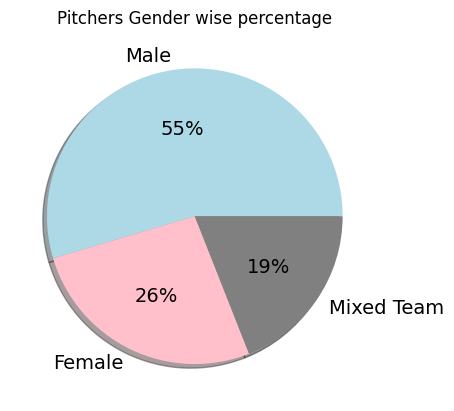

In [19]:
# Gender wise
print(shark_tank['Pitchers Gender'].value_counts(),"\n")

# In percentage
print(round(shark_tank['Pitchers Gender'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

plt.title("Pitchers Gender wise percentage")
shark_tank["Pitchers Gender"].value_counts().plot(kind='pie', autopct='%.0f%%', colors=["lightblue", "pink", "gray"], shadow=True, fontsize=14)
plt.ylabel('')

Pitchers Average Age
Middle    378
Young      31
Old         8
Name: count, dtype: int64 

Pitchers Average Age
Middle    91%
Young      7%
Old        2%
Name: proportion, dtype: object 



Text(0, 0.5, '')

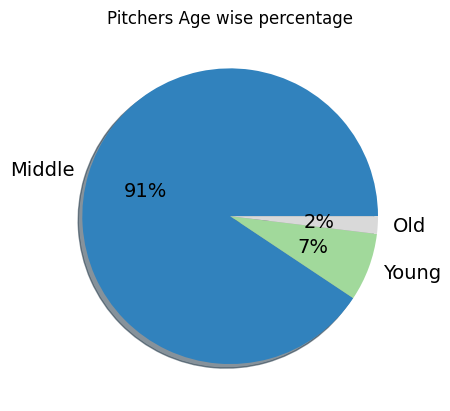

In [20]:
# Age wise
print(shark_tank['Pitchers Average Age'].value_counts(),"\n")

# In percentage
print(round(shark_tank['Pitchers Average Age'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

plt.title("Pitchers Age wise percentage")
shark_tank["Pitchers Average Age"].value_counts().plot(kind='pie', autopct='%.0f%%', cmap='tab20c', shadow=True, fontsize=14)
plt.ylabel('')

### 💹 60% companies received offers and 40% startups could not convince Sharks to invest

Got Deal
1    819
0    534
Name: count, dtype: int64 

Got Deal
1    61%
0    39%
Name: proportion, dtype: object


Text(0, 0.5, '')

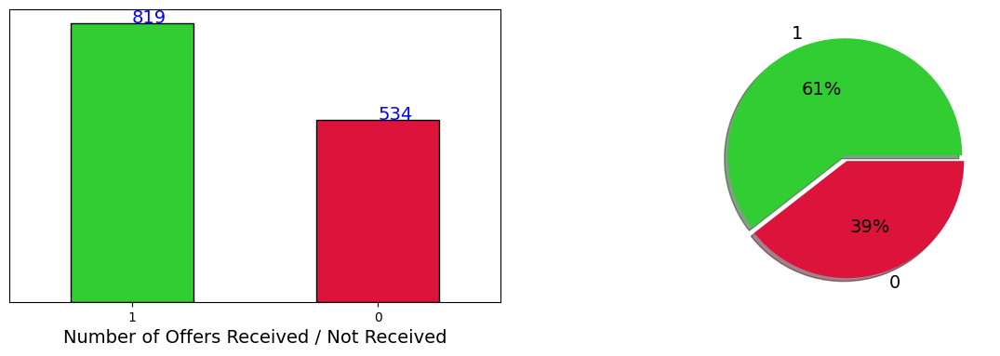

In [21]:
# Offers received
print(shark_tank['Got Deal'].value_counts(), "\n")
print(round(shark_tank['Got Deal'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
shark_tank["Got Deal"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Received / Not Received", size=14)
plt.yticks([])
plt.xticks(rotation=0)
for x,y in enumerate(shark_tank["Got Deal"].value_counts()):
    plt.annotate(y, (x,y), fontsize=14, color="blue")

ax2 = plt.subplot(222)
shark_tank["Got Deal"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=14)
plt.ylabel('')

# 808 companies received offers & 529 startups could not convince #Sharks to invest.

Pitchers Gender
Male          418
Female        228
Mixed Team    168
Name: count, dtype: int64


Text(0, 0.5, '')

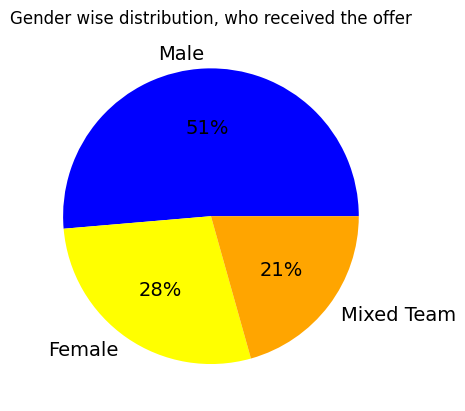

In [22]:
# Gender wise distribution, who received the offer
print(shark_tank[shark_tank['Got Deal']==1]['Pitchers Gender'].value_counts())
plt.title("Gender wise distribution, who received the offer")
shark_tank[shark_tank['Got Deal']==1]['Pitchers Gender'].value_counts().sort_values(ascending=False).plot.pie(autopct='%.0f%%',colors=["blue", "yellow", "orange"], fontsize=14)
plt.ylabel('')

Pitchers Gender
Male          317
Female        127
Mixed Team     88
Name: count, dtype: int64


Text(0, 0.5, '')

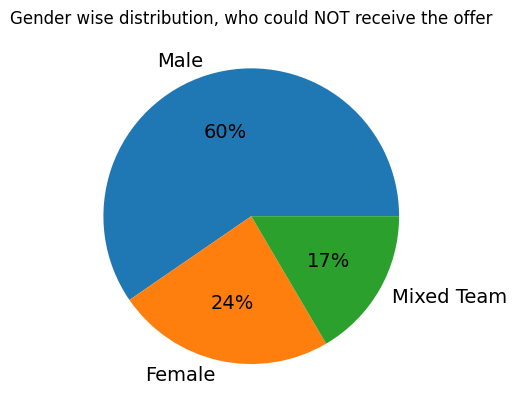

In [23]:
# Gender wise distribution, who could NOT receive the offer
print(shark_tank[shark_tank['Got Deal']==0]['Pitchers Gender'].value_counts())
plt.title("Gender wise distribution, who could NOT receive the offer")
shark_tank[shark_tank['Got Deal']==0]['Pitchers Gender'].value_counts().sort_values(ascending=False).plot.pie(autopct='%.0f%%', fontsize=14)
plt.ylabel('')

## ❗ USA Shark Tank dataset Visualizations/infographics in Tableau Public —
### https://public.tableau.com/views/SharkTankUS/SharkTankUSStory_1

In [24]:
IFrame("https://public.tableau.com/views/SharkTankUS/SharkTankUSStory_1", width=1100, height=1100)

In [25]:
# Maximum amount requested
print("Maximum amount requested, by a pitcher -", format_currency(shark_tank['Original Ask Amount'].max(), 'USD', locale='en_US').replace(".00", ""))

Maximum amount requested, by a pitcher - $5,000,000


In [26]:
# Least amount requested
print("Least amount requested, by a pitcher -", format_currency(shark_tank['Original Ask Amount'].min(), 'USD', locale='en_US').replace(".00", ""))

Least amount requested, by a pitcher - $10,000


In [27]:
# Sum of investment amount asked, in Shark Tank America
print("Sum of investment amount asked, by all startup companies, in US Shark Tank -", format_currency(shark_tank['Original Ask Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))

Sum of investment amount asked, by all startup companies, in US Shark Tank - $382,266,000


In [28]:
# Amount invested by all sharks, in US SharkTank
print("Amount invested by all sharks, in Shark Tank US -", format_currency(shark_tank['Total Deal Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))

Amount invested by all sharks, in Shark Tank US - $239,083,166


In [29]:
# Sum of loan/debt amount, in American Shark Tank
print("Sum of loan/debt amount, given by all sharks, in American SharkTank -", format_currency(shark_tank['Loan'].sum(), 'USD', locale='en_US').replace(".00", ""))

Sum of loan/debt amount, given by all sharks, in American SharkTank - $22,887,500


In [30]:
# Top 15 investments, as per total investment/deal amount
print(shark_tank.groupby('Startup Name')['Total Deal Amount'].max().nlargest(15))

shark_tank['Total Deal Amount in Millions'] = shark_tank['Total Deal Amount']/1000000
tmpdf = shark_tank.sort_values('Total Deal Amount in Millions', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Amount in Millions', color="Startup Name", title="Highest investment as per deal amount (in millions)", text=tmpdf['Total Deal Amount in Millions'].map(float).map(str))
fig.show()

Startup Name
AirCar                     5000000.0
MokiDoorstep               3000000.0
SynDaverLabs               3000000.0
Zipz                       2500000.0
DBestProducts              2350000.0
Fizzics                    2000000.0
TenThirtyOneProductions    2000000.0
Vengo                      2000000.0
RuggedManiac               1750000.0
BeyondSushi                1500000.0
Sworkit                    1500000.0
XCraft                     1500000.0
Trunkster                  1400000.0
HyConn                     1250000.0
Jackson'sHonest            1250000.0
Name: Total Deal Amount, dtype: float64


In [31]:
# Top 20 investments, as per total equity/shares percentage diluted
print(shark_tank.groupby('Startup Name')['Total Deal Equity'].max().nlargest(20))

tmpdf = shark_tank.sort_values('Total Deal Equity', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Highest investment as per equity percentage", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

# 9 startups sold entire company (equity) to Sharks

Startup Name
ClassroomJams           100.0
CoolWraps               100.0
Evrewares               100.0
Hugo'sAmazingTape       100.0
HyConn                  100.0
MokiDoorstep            100.0
RokBlok                 100.0
TurboBaster             100.0
WineBalloon             100.0
LegacyShave              95.0
GrooveBook               80.0
RemyxxReKixxSneakers     80.0
Henry'sHumdingers        75.0
JeskaShoeCompany         70.0
Lightfilm                70.0
TheUROClub               70.0
ReaderestSpecsecure      65.0
TheLastLid               60.0
TreasureChestPets        60.0
CordaRoy's               58.0
Name: Total Deal Equity, dtype: float64


In [32]:
# Startups who sold 1/3rd of their company (equity) to Sharks
print(shark_tank.loc[shark_tank['Total Deal Equity'] == 33.3][["Startup Name"]].count())
print(shark_tank.loc[shark_tank['Total Deal Equity'] == 33.3][["Season Number","Startup Name", "Total Deal Equity"]])

tmpdf = shark_tank.loc[shark_tank['Total Deal Equity'] == 33.3]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Startups who sold 1/3rd of their company", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name    24
dtype: int64
      Season Number                 Startup Name  Total Deal Equity
551               7                       Shefit               33.3
584               7                        Trobo               33.3
591               7                  TheDripDrop               33.3
604               7  EVPExtremeVehicleProtection               33.3
626               8             AngelsandTomboys               33.3
633               8                  Sunscreeenr               33.3
667               8                       Kooler               33.3
695               8                      Goverre               33.3
697               8            BootyQueenApparel               33.3
702               8                PeoplesDesign               33.3
726               9                  HumanBobber               33.3
768               9              GoatPetProducts               33.3
829              10                     OatMeals               33.3
865             

In [33]:
# Startups who got Debt/loan amount
print("Number of startups who got debt/loan amount", shark_tank['Loan'].count(),"\n")

shark_tank.loc[shark_tank['Loan'] >= 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity","Loan"]]

Number of startups who got debt/loan amount 55 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Loan
272,5,RapidRamenCooker,150000.0,15.00,150000.0
289,5,BetterLife,400000.0,17.00,400000.0
291,5,PaparazziProposals,250000.0,33.00,200000.0
299,5,Grace&Lace,87500.0,10.00,87500.0
300,5,Yubo,150000.0,20.00,150000.0
433,6,Scratch&GrainBakingCo,150000.0,20.00,150000.0
459,6,CocoJack,125000.0,25.00,125000.0
571,7,BetterBack,750000.0,8.00,750000.0
580,7,Vengo,2000000.0,10.00,2000000.0
586,7,Coolbox,500000.0,15.00,500000.0


In [34]:
# Startups who gave Royalty
print("Number of startups who gave Royalty", shark_tank['Royalty Deal'].count(),"\n")

shark_tank.loc[shark_tank['Royalty Deal'] == 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who gave Royalty 80 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
6,1,ClassroomJams,250000.0,100.0
10,1,TurboBaster,35000.0,100.0
26,1,ElementBars,150000.0,30.0
69,2,FirstDefenseNasalScreen,750000.0,30.0
72,2,ModMomFurniture,90000.0,33.0
...,...,...,...,...
1296,15,SupermixStudio,250000.0,20.0
1300,15,BunnyEyez,200000.0,20.0
1311,15,DingleDangle,75000.0,20.0
1315,15,Poplight,150000.0,8.0


In [35]:
# Startups who gave Advisory shares
print("Number of startups who gave Advisory shares/equity", shark_tank['Advisory Shares Equity'].count(),"\n")

shark_tank.loc[shark_tank['Advisory Shares Equity'] > 0][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity", "Advisory Shares Equity"]]

Number of startups who gave Advisory shares/equity 2 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Advisory Shares Equity
1326,15,Flora,300000.0,15.0,5.0
1348,15,Richaulist,150000.0,15.0,5.0


In [36]:
# Deals with conditions
print("Number of startups who accepted conditional deals", shark_tank['Deal Has Conditions'].count(),"\n")

shark_tank.loc[shark_tank['Deal Has Conditions'] == 'yes'][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who accepted conditional deals 2 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
1334,15,FilaManila,250000.0,20.0
1352,15,Blinger,200000.0,25.0


In [37]:
# Gender/age wise pitchers combination
shark_tank.groupby([shark_tank['Pitchers Gender'], shark_tank['Pitchers Average Age'], shark_tank['Multiple Entrepreneurs']]).size().nlargest(10)

# Groups/Couples in middle age is most frequent combination followed by Male/Female in middle age

Pitchers Gender  Pitchers Average Age  Multiple Entrepreneurs
Mixed Team       Middle                1                         98
Male             Middle                0                         85
Female           Middle                0                         83
Male             Middle                1                         83
Female           Middle                1                         28
                 Young                 0                          9
Male             Young                 0                          7
                                       1                          6
Mixed Team       Old                   1                          5
Female           Young                 1                          4
dtype: int64

## 💰 Which shark invested most ?

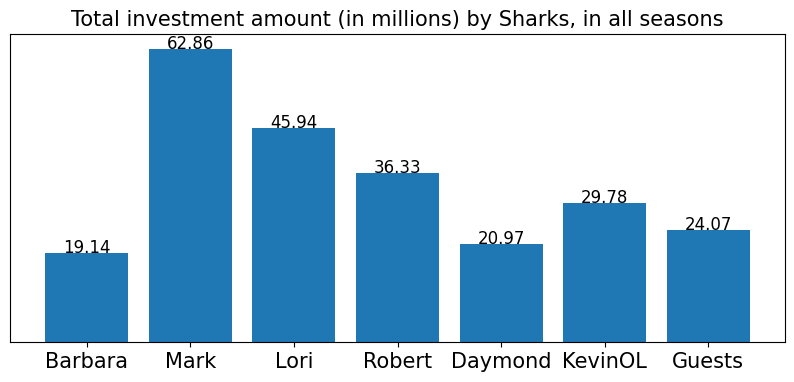

In [38]:
# Amount Invested by sharks
Amount = [(shark_tank['Barbara Corcoran Investment Amount']/1000000).sum(), (shark_tank['Mark Cuban Investment Amount']/1000000).sum(), (shark_tank['Lori Greiner Investment Amount']/1000000).sum(), (shark_tank['Robert Herjavec Investment Amount']/1000000).sum(),
    (shark_tank['Daymond John Investment Amount']/1000000).sum(), (shark_tank['Kevin O Leary Investment Amount']/1000000).sum(), (shark_tank['Guest Investment Amount']/1000000).sum()]
name=['Barbara','Mark','Lori','Robert','Daymond','KevinOL','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y=d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total investment amount (in millions) by Sharks, in all seasons", fontsize=15)
plt.show()

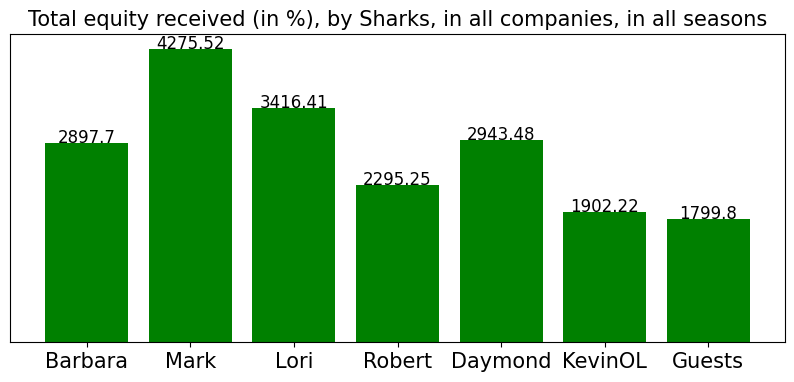

In [39]:
# Equity received by sharks, in all seasons
Equity = [shark_tank['Barbara Corcoran Investment Equity'].sum(), shark_tank['Mark Cuban Investment Equity'].sum(), shark_tank['Lori Greiner Investment Equity'].sum(), shark_tank['Robert Herjavec Investment Equity'].sum(),
    shark_tank['Daymond John Investment Equity'].sum(), shark_tank['Kevin O Leary Investment Equity'].sum(), shark_tank['Guest Investment Equity'].sum()]
name=['Barbara','Mark','Lori','Robert','Daymond','KevinOL','Guests']
df = {'Name':name, 'Total Equity':Equity}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Equity):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total equity received (in %), by Sharks, in all companies, in all seasons", fontsize=15)
plt.show()

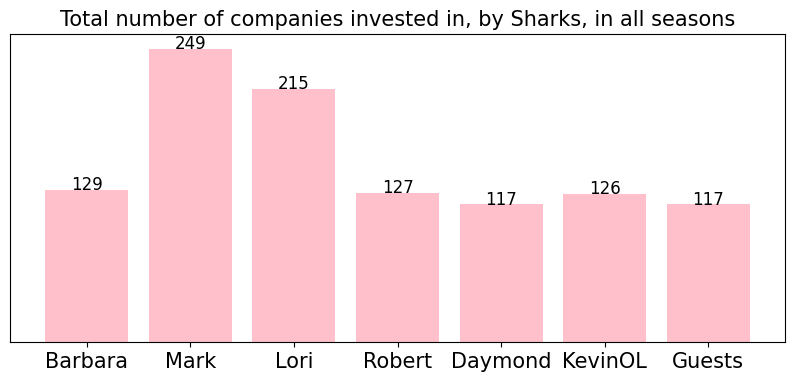

In [40]:
# Number of companies invested
Amount = [(shark_tank['Barbara Corcoran Investment Amount']).count(), (shark_tank['Mark Cuban Investment Amount']).count(), (shark_tank['Lori Greiner Investment Amount']).count(), (shark_tank['Robert Herjavec Investment Amount']).count(),
    (shark_tank['Daymond John Investment Amount']).count(), (shark_tank['Kevin O Leary Investment Amount']).count(), (shark_tank['Guest Investment Amount']).count()]
name=['Barbara','Mark','Lori','Robert','Daymond','KevinOL','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y=d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total number of companies invested in, by Sharks, in all seasons", fontsize=15)
plt.show()

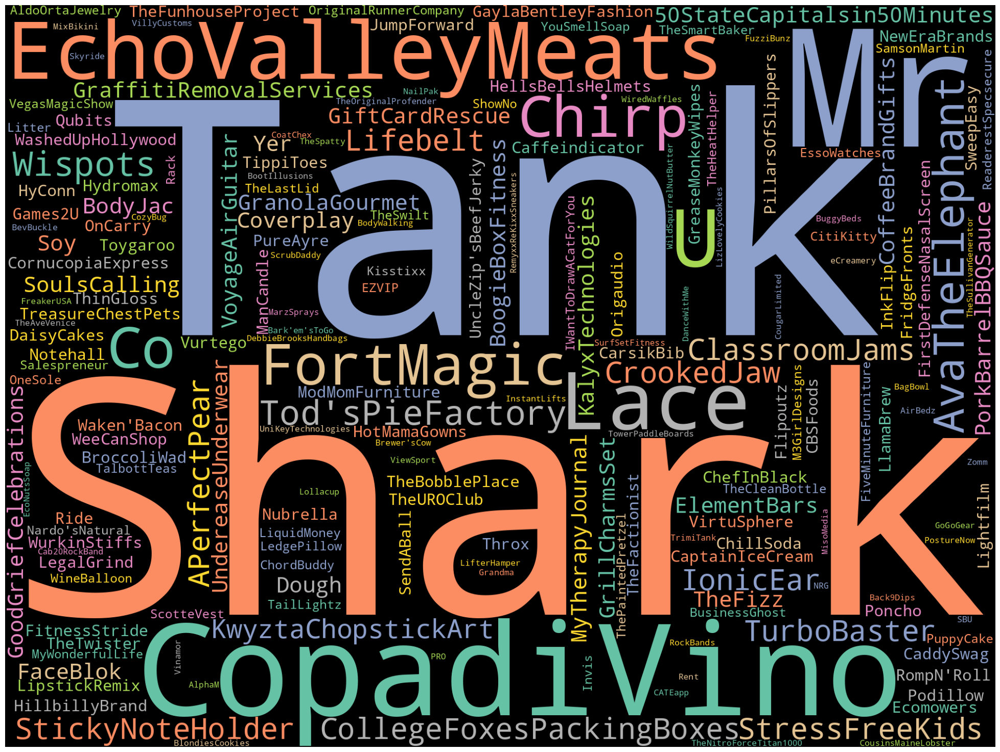

In [41]:
# Word cloud based on Startup Names, in all seasons
text = " Shark Tank ".join(cat for cat in shark_tank['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='black', colormap='Set2', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

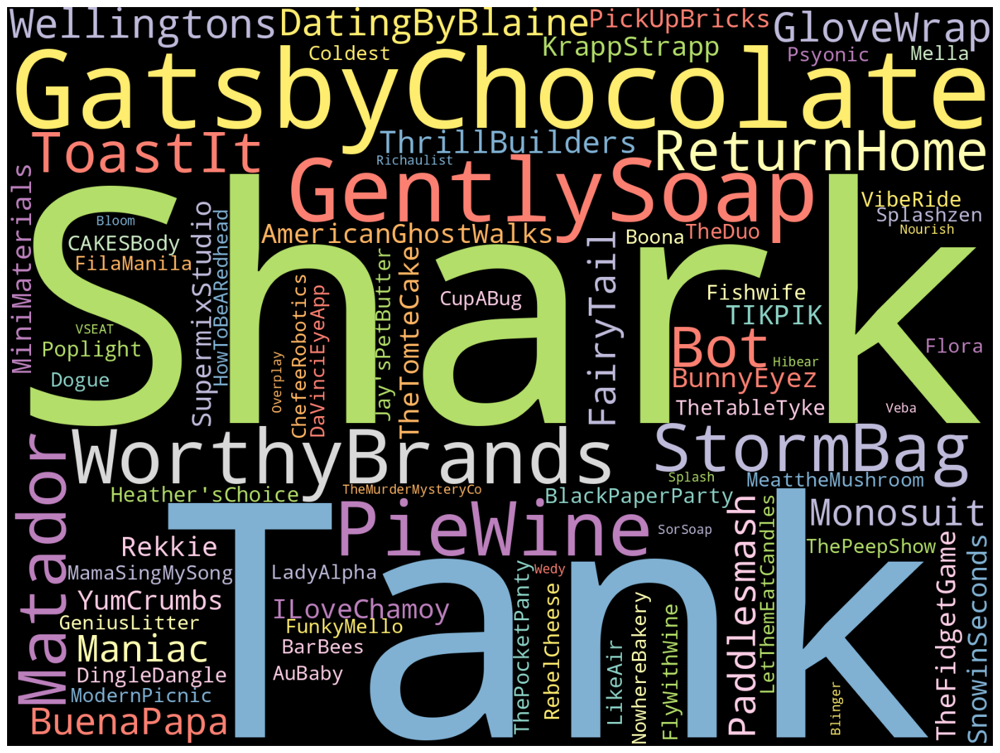

In [42]:
# Word cloud based on Startup Names, in current/latest season (15th season)
text = " Shark Tank ".join(cat for cat in shark_tank_recent['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=1600, height=1200, stopwords=stop_words, background_color='black', colormap='Set3', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(18,15))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## 🔎 Shark Tank India Dataset https://www.kaggle.com/datasets/thirumani/shark-tank-india

## 🔥Barbara Corcoran's Investments


Total investments by Barbara Corcoran 129
Investment amount by Barbara Corcoran $19,140,000
Equity received by Barbara Corcoran 2897.7 % in different companies

Company details:
------------------------------------------------------------------------------------------
               Startup Name                Industry  Barbara Corcoran Investment Amount
             AvaTheElephant         Health/Wellness                             50000.0
         Mr.Tod'sPieFactory       Food and Beverage                            230000.0
              ClassroomJams      Children/Education                             50000.0
             StressFreeKids      Children/Education                            250000.0
                  Coverplay      Children/Education                             35000.0
                    BodyJac Fitness/Sports/Outdoors                            180000.0
         PorkBarrelBBQSauce       Food and Beverage                             50000.0
          TreasureChestPets

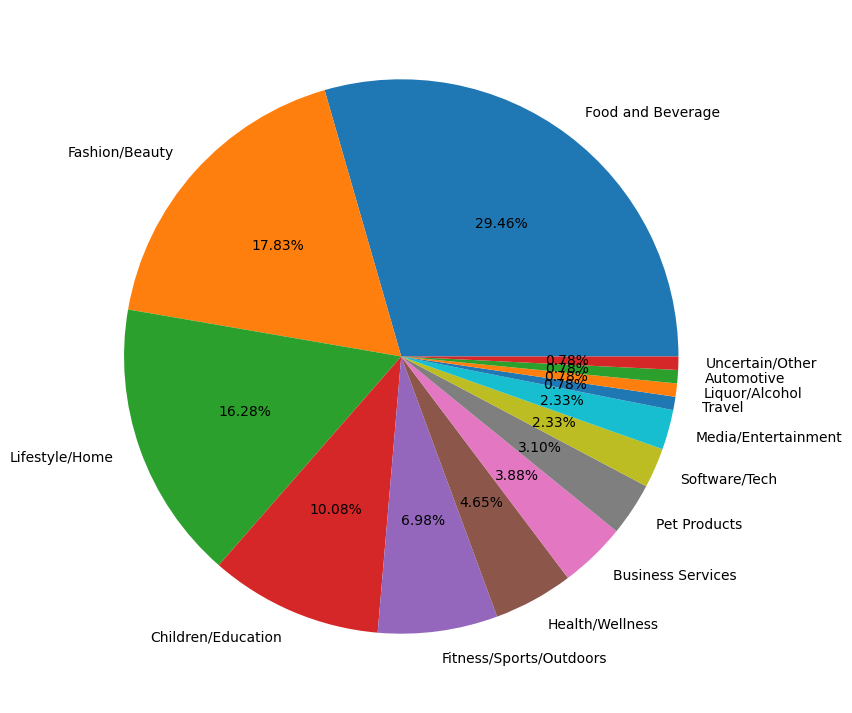

In [43]:
print("Total investments by Barbara Corcoran", shark_tank[shark_tank['Barbara Corcoran Investment Amount']>0][['Barbara Corcoran Investment Amount']].count().to_string()[-3:])
print("Investment amount by Barbara Corcoran", format_currency(shark_tank['Barbara Corcoran Investment Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))
print("Equity received by Barbara Corcoran", round(shark_tank['Barbara Corcoran Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Barbara Corcoran Investment Amount']>0][["Startup Name","Industry","Barbara Corcoran Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nBarbara Corcoran industry wise investments\n")
print(shark_tank[shark_tank['Barbara Corcoran Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Barbara Corcoran Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Barbara Corcoran Investment Amount']>0] [["Startup Name","Barbara Corcoran Investment Amount","Barbara Corcoran Investment Equity"]].sort_values(by="Barbara Corcoran Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Barbara Corcoran Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎇 Mark Cuban's Investments

Total investments by Mark Cuban 249
Investment amount by Mark Cuban $62,857,666.67
Equity received by Mark Cuban 4275.52 % in different companies

Company details:
------------------------------------------------------------------------------------------
             Startup Name                Industry  Mark Cuban Investment Amount
            ClassroomJams      Children/Education                  5.000000e+04
                TippiToes Fitness/Sports/Outdoors                  5.000000e+04
                 Toygaroo      Children/Education                  1.000000e+05
  FirstDefenseNasalScreen         Health/Wellness                  2.500000e+05
                   HyConn         Uncertain/Other                  1.250000e+06
                    EZVIP     Media/Entertainment                  7.500000e+04
           TheCleanBottle       Food and Beverage                  6.000000e+04
    IWantToDrawACatForYou           Software/Tech                  2.500000e+04
              WineBalloon

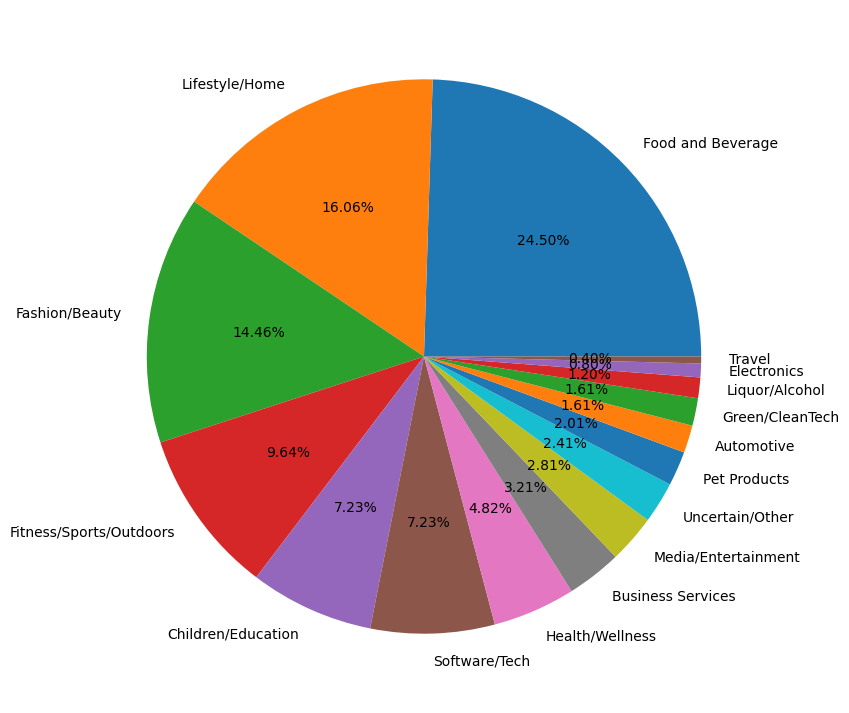

In [44]:
print("Total investments by Mark Cuban", shark_tank[shark_tank['Mark Cuban Investment Amount']>0][['Mark Cuban Investment Amount']].count().to_string()[-3:])
print("Investment amount by Mark Cuban", format_currency(shark_tank['Mark Cuban Investment Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))
print("Equity received by Mark Cuban", round(shark_tank['Mark Cuban Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Mark Cuban Investment Amount']>0][["Startup Name","Industry","Mark Cuban Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nMark Cuban industry wise investments\n")
print(shark_tank[shark_tank['Mark Cuban Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Mark Cuban Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Mark Cuban Investment Amount']>0] [["Startup Name","Mark Cuban Investment Amount","Mark Cuban Investment Equity"]].sort_values(by="Mark Cuban Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Mark Cuban Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ✳️ Lori Greiner's Investments

Total investments by Lori Greiner 215
Investment amount by Lori Greiner $45,942,500
Equity received by Lori Greiner 3416.41 % in different companies

Company details:
------------------------------------------------------------------------------------------
          Startup Name                Industry  Lori Greiner Investment Amount
                ShowNo          Fashion/Beauty                    7.500000e+04
         M3GirlDesigns          Fashion/Beauty                    1.000000e+05
   ReaderestSpecsecure          Lifestyle/Home                    1.500000e+05
               NailPak          Fashion/Beauty                    5.000000e+04
               BagBowl          Lifestyle/Home                    4.000000e+04
             Back9Dips       Food and Beverage                    7.500000e+04
            MarzSprays         Health/Wellness                    2.000000e+05
            ScrubDaddy          Lifestyle/Home                    2.000000e+05
          TheCoolWazoo      Chi

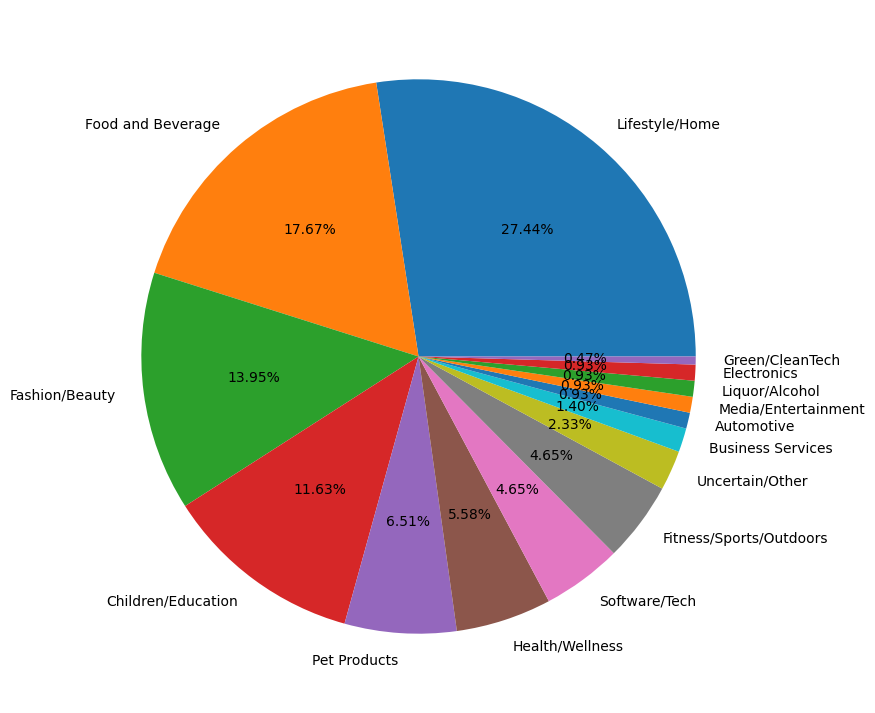

In [45]:
print("Total investments by Lori Greiner", shark_tank[shark_tank['Lori Greiner Investment Amount']>0][['Lori Greiner Investment Amount']].count().to_string()[-3:])
print("Investment amount by Lori Greiner", format_currency(shark_tank['Lori Greiner Investment Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))
print("Equity received by Lori Greiner", round(shark_tank['Lori Greiner Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Lori Greiner Investment Amount']>0][["Startup Name","Industry","Lori Greiner Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nLori Greiner industry wise investments\n")
print(shark_tank[shark_tank['Lori Greiner Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Lori Greiner Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Lori Greiner Investment Amount']>0] [["Startup Name","Lori Greiner Investment Amount","Lori Greiner Investment Equity"]].sort_values(by="Lori Greiner Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Lori Greiner Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🚀 Robert Herjavec's Investments

Total investments by Robert Herjavec 127
Investment amount by Robert Herjavec $36,330,666
Equity received by Robert Herjavec 2295.25 % in different companies

Company details:
------------------------------------------------------------------------------------------
           Startup Name                Industry  Robert Herjavec Investment Amount
           APerfectPear       Food and Beverage                       2.500000e+05
          ClassroomJams      Children/Education                       5.000000e+04
         GiftCardRescue           Software/Tech                       1.000000e+05
       MyTherapyJournal         Health/Wellness                       4.000000e+04
          Soy-Yer-Dough       Food and Beverage                       1.000000e+05
         GrillCharmsSet          Fashion/Beauty                       5.000000e+04
            JumpForward      Children/Education                       3.000000e+05
      GreaseMonkeyWipes          Lifestyle/Home                      

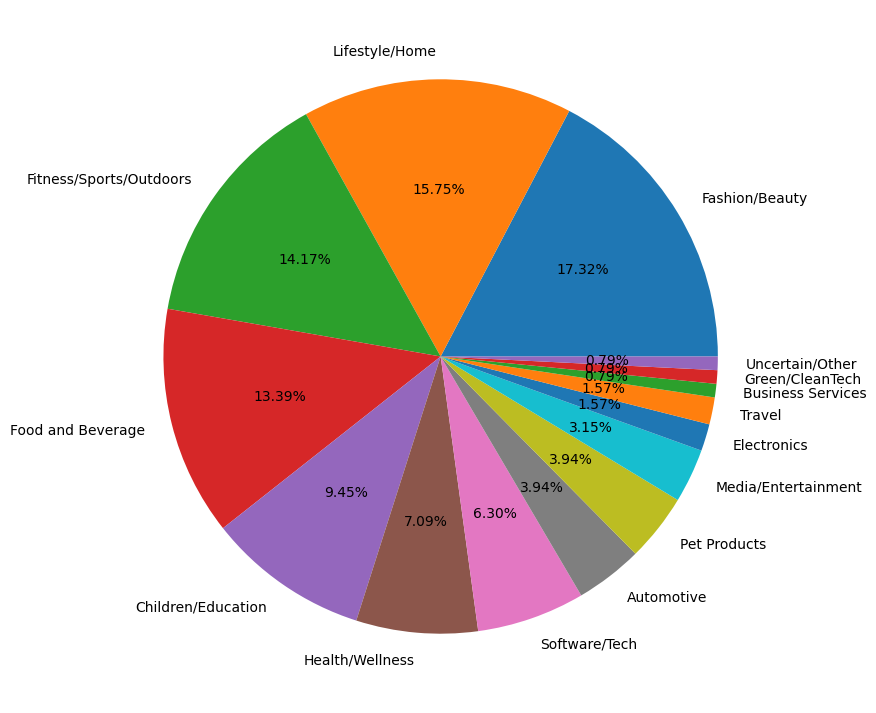

In [46]:
print("Total investments by Robert Herjavec", shark_tank[shark_tank['Robert Herjavec Investment Amount']>0][['Robert Herjavec Investment Amount']].count().to_string()[-3:])
print("Investment amount by Robert Herjavec", format_currency(shark_tank['Robert Herjavec Investment Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))
print("Equity received by Robert Herjavec", round(shark_tank['Robert Herjavec Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Robert Herjavec Investment Amount']>0][["Startup Name","Industry","Robert Herjavec Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nRobert Herjavec industry wise investments\n")
print(shark_tank[shark_tank['Robert Herjavec Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Robert Herjavec Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Robert Herjavec Investment Amount']>0] [["Startup Name","Robert Herjavec Investment Amount","Robert Herjavec Investment Equity"]].sort_values(by="Robert Herjavec Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Robert Herjavec Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎾 Daymond John's Investments

Total investments by Daymond John 117
Investment amount by Daymond John $20,965,666.67
Equity received by Daymond John 2943.48 % in different companies

Company details:
------------------------------------------------------------------------------------------
               Startup Name                Industry  Daymond John Investment Amount
         Mr.Tod'sPieFactory       Food and Beverage                     230000.0000
              ClassroomJams      Children/Education                      50000.0000
              Soy-Yer-Dough       Food and Beverage                     100000.0000
          TreasureChestPets            Pet Products                      50000.0000
        GaylaBentleyFashion          Fashion/Beauty                     125000.0000
          HellsBellsHelmets Fitness/Sports/Outdoors                     500000.0000
              LipstickRemix          Fashion/Beauty                      52500.0000
                   Nubrella          Fashion/Beauty                

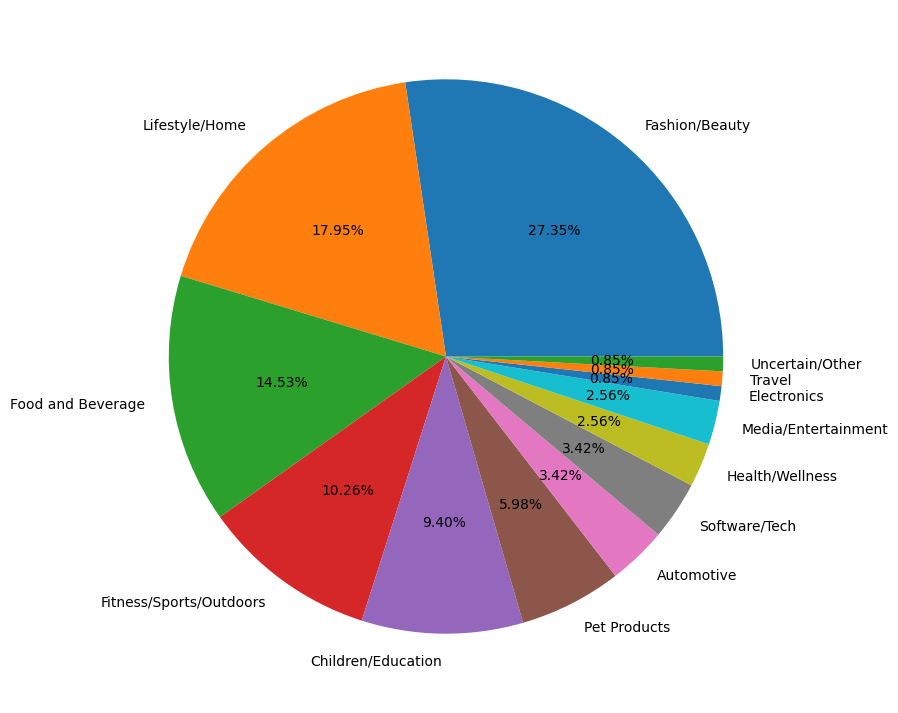

In [47]:
print("Total investments by Daymond John", shark_tank[shark_tank['Daymond John Investment Amount']>0][['Daymond John Investment Amount']].count().to_string()[-3:])
print("Investment amount by Daymond John", format_currency(shark_tank['Daymond John Investment Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))
print("Equity received by Daymond John", round(shark_tank['Daymond John Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Daymond John Investment Amount']>0][["Startup Name","Industry","Daymond John Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nDaymond John industry wise investments\n")
print(shark_tank[shark_tank['Daymond John Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Daymond John Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Daymond John Investment Amount']>0] [["Startup Name","Daymond John Investment Amount","Daymond John Investment Equity"]].sort_values(by="Daymond John Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Daymond John Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ⭐ Kevin O Leary's Investments

Total investments by Kevin O Leary 126
Investment amount by Kevin O Leary $29,780,833.33
Equity received by Kevin O Leary 1902.22 % in different companies

Company details:
------------------------------------------------------------------------------------------
          Startup Name                Industry  Kevin O Leary Investment Amount
          APerfectPear       Food and Beverage                     2.500000e+05
         ClassroomJams      Children/Education                     5.000000e+04
        GiftCardRescue           Software/Tech                     1.000000e+05
      MyTherapyJournal         Health/Wellness                     4.000000e+04
         Soy-Yer-Dough       Food and Beverage                     1.000000e+05
           JumpForward      Children/Education                     3.000000e+05
              Toygaroo      Children/Education                     1.000000e+05
          FridgeFronts          Lifestyle/Home                     5.000000e+04
           Talbo

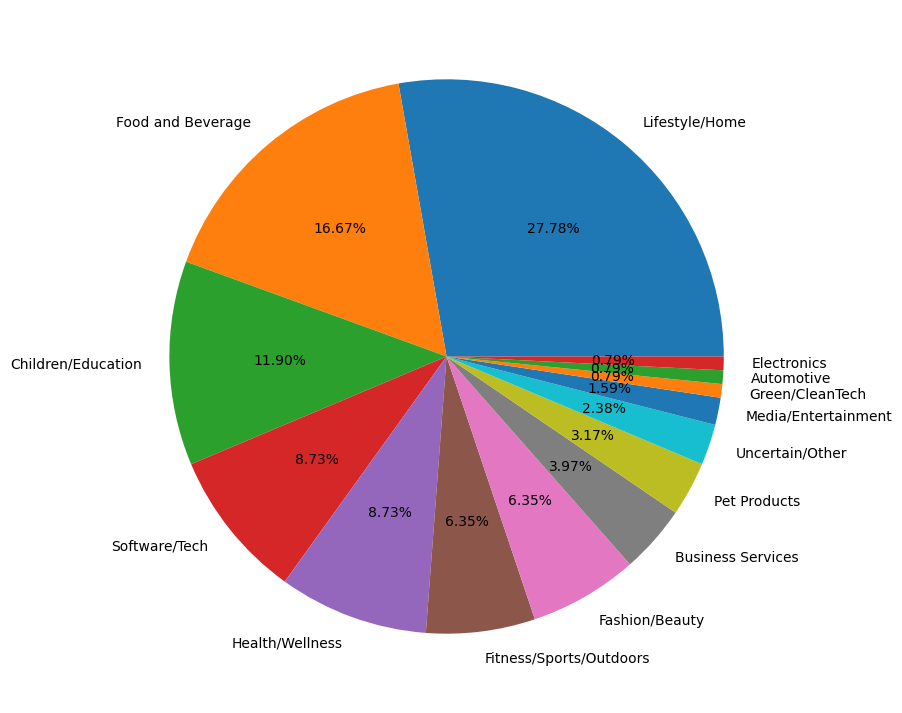

In [48]:
print("Total investments by Kevin O Leary", shark_tank[shark_tank['Kevin O Leary Investment Amount']>0][['Kevin O Leary Investment Amount']].count().to_string()[-3:])
print("Investment amount by Kevin O Leary", format_currency(shark_tank['Kevin O Leary Investment Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))
print("Equity received by Kevin O Leary", round(shark_tank['Kevin O Leary Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(shark_tank.loc[shark_tank['Kevin O Leary Investment Amount']>0][["Startup Name","Industry","Kevin O Leary Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nKevin O Leary industry wise investments\n")
print(shark_tank[shark_tank['Kevin O Leary Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Kevin O Leary Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Kevin O Leary Investment Amount']>0] [["Startup Name","Kevin O Leary Investment Amount","Kevin O Leary Investment Equity"]].sort_values(by="Kevin O Leary Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Kevin O Leary Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎆 All Guest's Investments

Total investments by all Guests 17
Investment amount by all Guests $24,065,833.33
Equity received by all Guests 1799.8 % in different companies

Company details:
--------------------------------------------------------------------------------------------
             Startup Name                Industry  Guest Investment Amount        Guest Name
              TurboBaster       Food and Beverage             3.500000e+04  Kevin Harrington
              ElementBars Fitness/Sports/Outdoors             1.500000e+05  Kevin Harrington
               TheUROClub Fitness/Sports/Outdoors             2.500000e+04  Kevin Harrington
           Caffeindicator       Food and Beverage             2.000000e+05  Kevin Harrington
                 Hydromax Fitness/Sports/Outdoors             5.000000e+04    Jeff Foxworthy
                CitiKitty            Pet Products             1.000000e+05  Kevin Harrington
               Tree-T-Pee         Green/CleanTech             1.500000e+05 John Paul DeJoria
 

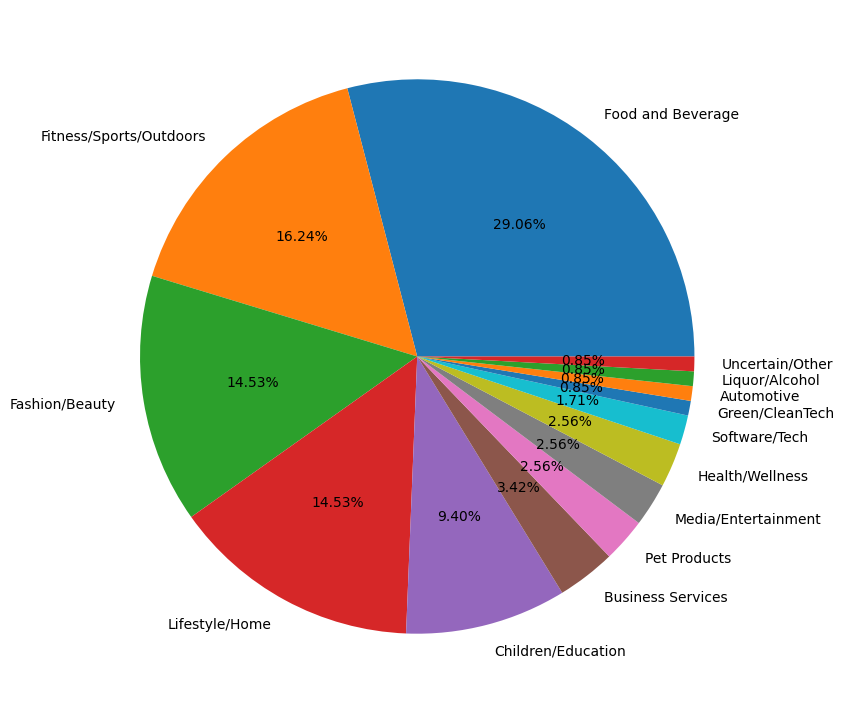

In [49]:
print("Total investments by all Guests", shark_tank[shark_tank['Guest Investment Amount']>0][['Guest Investment Amount']].count().to_string()[-2:])
print("Investment amount by all Guests", format_currency(shark_tank['Guest Investment Amount'].sum(), 'USD', locale='en_US').replace(".00", ""))
print("Equity received by all Guests", round(shark_tank['Guest Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*92)
print(shark_tank.loc[shark_tank['Guest Investment Amount']>0][["Startup Name","Industry","Guest Investment Amount","Guest Name"]].to_string(index=False))
print('-'*92)

print("\nAll Guests industry wise investments\n")
print(shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Guest Investment Amount']>0] [["Startup Name","Guest Investment Amount","Guest Investment Equity"]].sort_values(by="Guest Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Guest Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

In [50]:
# Top 10, guest sharks who invested in most number of companies
shark_tank.loc[shark_tank['Guest Investment Amount'] > 1].groupby('Guest Name').size().nlargest(10)

Guest Name
Daniel Lubetzky     19
Emma Grede           9
Alex Rodriguez       8
Chris Sacca          8
Rohan Oza            8
Kendra Scott         5
Kevin Harrington     5
Matt Higgins         4
Peter Jones          4
Sara Blakely         4
dtype: int64

In [51]:
# Investment amount by guests, in Millions
round(shark_tank.groupby(["Guest Name"])["Guest Investment Amount"].sum().sort_values(ascending=False)/1000000,2)

Guest Name
Daniel Lubetzky      4.99
Rohan Oza            3.58
Chris Sacca          1.57
Matt Higgins         1.52
Emma Grede           1.45
Alex Rodriguez       1.24
Kendra Scott         1.10
Tony Xu              0.88
Peter Jones          0.80
Sara Blakely         0.70
Kevin Hart           0.65
Kevin Harrington     0.51
Jamie Siminoff       0.50
Jason Blum           0.45
Maria Sharapova      0.45
Charles Barkley      0.38
Richard Branson      0.36
Gwyneth Paltrow      0.32
Candace Nelson       0.25
Daniel Lubetzsky     0.25
Anne Wojcicki        0.25
Nirav Tolia          0.22
Katrina Lake         0.20
Blake Mycoskie       0.20
Ashton Kutcher       0.20
Troy Carter          0.20
Michael Rubin        0.18
John Paul DeJoria    0.15
Nick Woodman         0.12
Bethenny Frankel     0.12
Alli Webb            0.09
Nirv Tolia           0.08
Jeff Foxworthy       0.05
Steve Tisch          0.05
Name: Guest Investment Amount, dtype: float64

Number of Sharks in Deal
1.0    603
2.0    186
3.0     21
5.0      6
4.0      3
Name: count, dtype: int64 

Number of Sharks in Deal
1.0    74%
2.0    23%
3.0     3%
5.0     1%
4.0     0%
Name: proportion, dtype: object


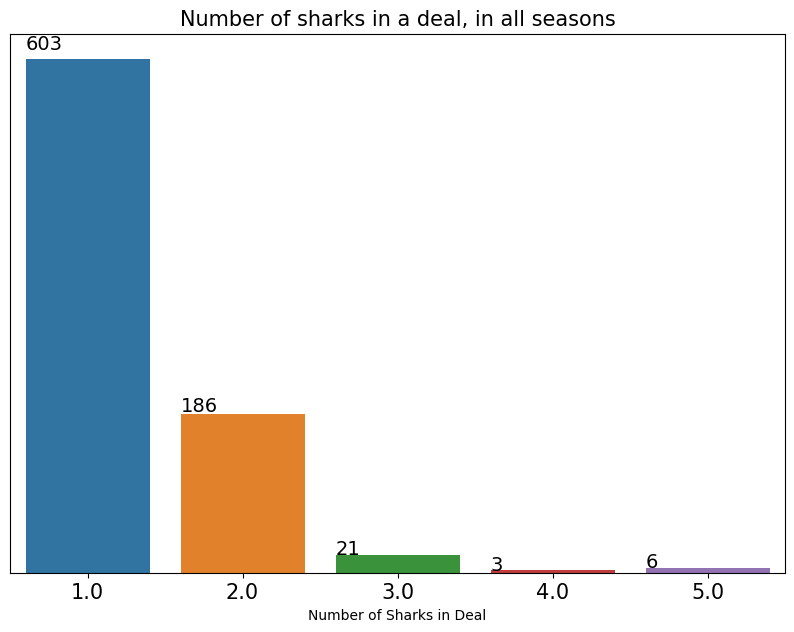

In [52]:
# Number of sharks in a deal, in all seasons
print(shark_tank['Number of Sharks in Deal'].value_counts(), "\n")

# In percentage
print(round(shark_tank['Number of Sharks in Deal'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

fig = plt.figure(figsize=(10, 7))
plt.title("Number of sharks in a deal, in all seasons", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks([])
ax = sns.countplot(data = shark_tank, x = 'Number of Sharks in Deal')
ax.set_ylabel('')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.02), size=14)

In [53]:
# All sharks deals
print(shark_tank.loc[shark_tank['Number of Sharks in Deal'] >= 5][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]])

      Season Number   Startup Name  Total Deal Amount  Total Deal Equity
6                 1  ClassroomJams           250000.0              100.0
161               4      BuggyBeds           250000.0               25.0
268               5   Breathometer          1000000.0               30.0
514               7         XCraft          1500000.0               25.0
814              10    CupBoardPro           100000.0               20.0
1272             14        Eyewris           125000.0               20.0


In [54]:
# Sharks with most number of solo deals
amt_cols = shark_tank.columns[shark_tank.columns.str.contains(' Investment Amount')].tolist()
tmp = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 1][amt_cols]
tmp.count().sort_values(ascending=False).nlargest(3)

# MarkCuban did most number of solo deals, than any other Shark

Mark Cuban Investment Amount          128
Lori Greiner Investment Amount        108
Barbara Corcoran Investment Amount     87
dtype: int64

In [55]:
# Sharks with most number of episode presence, in all seasons
present_cols = shark_tank.columns[shark_tank.columns.str.endswith(' Present')].tolist()
tmp = shark_tank[present_cols]
tmp.sum().sort_values(ascending=False).nlargest(3)

# Kevin was there in most number of episodes

Kevin O Leary Present      937.0
Mark Cuban Present         892.0
Robert Herjavec Present    824.0
dtype: float64

In [56]:
# Top 25 US 🇺🇸 states of pitcher's
tmp = shark_tank['Pitchers State'].value_counts().nlargest(20).sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b>Top 20 States</b> from where pitchers came from", template='simple_white', text=tmp, width=850, height=750)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [57]:
# Top 20 US cities
tmp = shark_tank['Pitchers City'].value_counts().nlargest(20).sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b>Top 20 USA cities</b> with number of startups came for pitching", template='simple_white', text=tmp, width=850, height=800)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [58]:
# Most frequently asked amount, by startups
shark_tank.groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (USD) and Number times asked

Original Ask Amount
100000    167
200000    143
150000    142
500000    137
250000    125
300000    105
50000      89
75000      55
400000     54
125000     30
dtype: int64

In [59]:
# Most frequently offered equity, by startups
shark_tank.groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered

Original Offered Equity
10.0    439
20.0    227
5.0     195
15.0    161
25.0     73
30.0     33
8.0      32
7.0      19
2.5      15
12.0     15
dtype: int64

In [60]:
# ✅ Most frequently invested amount, by Sharks
shark_tank.groupby('Total Deal Amount').size().nlargest(10)

# Sharks mostly invested more than 100K per deal

# Total Deal Amount (USD) and Number times invested

Total Deal Amount
100000.0    106
200000.0     92
150000.0     85
300000.0     76
250000.0     75
500000.0     74
50000.0      45
75000.0      35
400000.0     27
600000.0     19
dtype: int64

In [61]:
# ✅ Most frequently received total equity, by Sharks
shark_tank.groupby('Total Deal Equity').size().nlargest(10)

# Sharks are expecting more than 20% equity, in a deal

# Total Deal Equity (in %) and Number times invested

Total Deal Equity
20.0    139
25.0    122
10.0     81
15.0     75
30.0     70
40.0     35
50.0     34
5.0      26
33.3     24
33.0     23
dtype: int64

In [62]:
# Most frequently asked amount, deals received % and not received %
tmp2 = pd.crosstab(shark_tank['Original Ask Amount'], shark_tank['Got Deal']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

# Most frequest Deal Amount (in USD) and % of deal received and not received

,deal_percentage,no_deal_percentage
100000,64.0,36.0
150000,65.0,35.0
200000,63.0,37.0
250000,66.0,34.0
500000,55.0,45.0
300000,65.0,35.0
50000,64.0,36.0
75000,60.0,40.0
400000,56.0,44.0
350000,77.0,23.0


In [63]:
# Most frequently asked amount, deals received % and not received %
tmp2 = pd.crosstab(shark_tank['Original Offered Equity'], shark_tank['Got Deal']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

# Most frequest Offered Equity (in %) and % of deal received and not received

,deal_percentage,no_deal_percentage
10.0,65.0,35.0
5.0,63.0,37.0
20.0,51.0,49.0
15.0,63.0,37.0
25.0,53.0,47.0
8.0,56.0,44.0
30.0,48.0,52.0
7.0,84.0,16.0
4.0,86.0,14.0
6.0,86.0,14.0


In [64]:
# Mostly successful combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Got Deal'] == 1].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

# If you are pitching in US Shark Tank, ask for 150K-300K with 10% equity ✅

Original Ask Amount  Original Offered Equity
200000               10.0                       41
150000               10.0                       39
100000               10.0                       38
300000               10.0                       35
250000               10.0                       28
100000               20.0                       25
500000               10.0                       21
150000               15.0                       20
500000               5.0                        20
250000               5.0                        18
dtype: int64

In [65]:
# Most frequently asked amount, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Got Deal'] == 0].groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (USD) and Number times asked (but rejected by sharks) ❌

Original Ask Amount
500000    62
100000    60
200000    53
150000    50
250000    43
300000    37
50000     32
400000    24
75000     22
125000    15
dtype: int64

In [66]:
# Most frequently offered equity, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Got Deal'] == 0].groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered (but rejected by sharks) ❌

Original Offered Equity
10.0    155
20.0    112
5.0      73
15.0     60
25.0     34
30.0     17
8.0      14
40.0      8
3.0       6
7.5       5
dtype: int64

In [67]:
# Mostly rejected combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Got Deal'] == 0].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

# If you are pitching in Shark Tank US, don't ask for 100K with 10%/20% equity or 500K with 5% equity 🔴

Original Ask Amount  Original Offered Equity
100000               10.0                       23
                     20.0                       21
500000               5.0                        20
200000               10.0                       17
250000               10.0                       16
300000               10.0                       16
150000               10.0                       15
200000               20.0                       14
500000               10.0                       14
150000               20.0                       12
dtype: int64

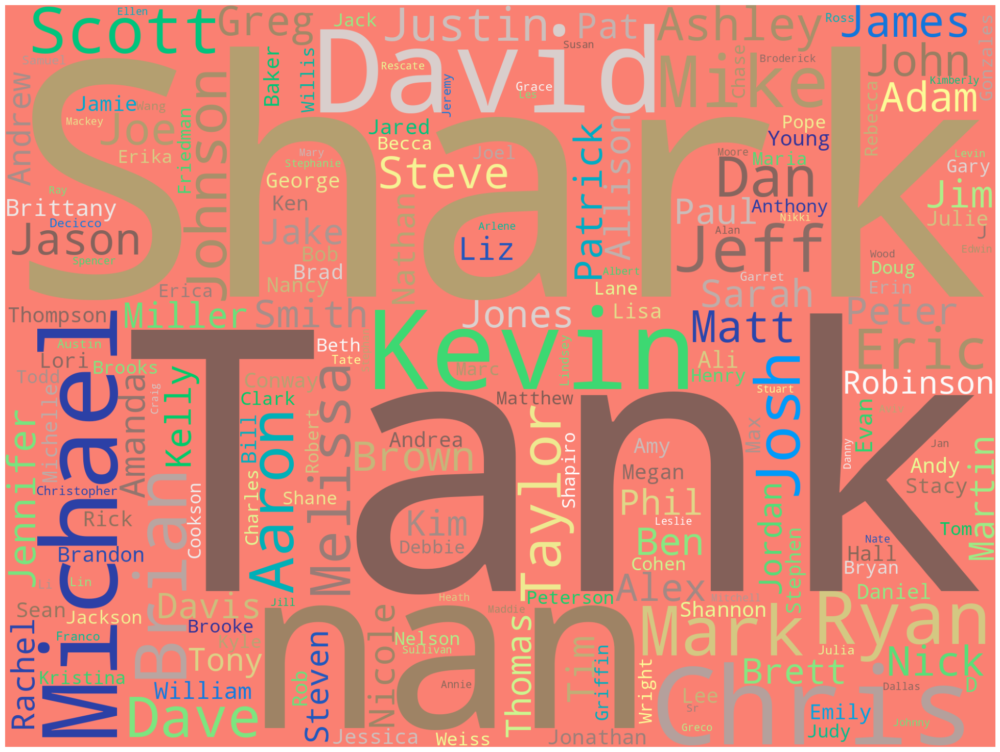

In [68]:
# Word cloud based on Pitcher name
text = " Shark Tank ".join(cat for cat in shark_tank['Entrepreneur Names'].astype(str))
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='terrain_r', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [69]:
# Many (132) companies got more amount than they asked/expected
print(shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Season Number","Startup Name","Original Ask Amount","Total Deal Amount"]]

Startup Name    132
dtype: int64


,Season Number,Startup Name,Original Ask Amount,Total Deal Amount
15,1,GiftCardRescue,150000,200000.0
30,1,Soy-Yer-Dough,125000,300000.0
43,1,JumpForward,150000,600000.0
64,2,WurkinStiffs,85000,100000.0
65,2,TippiToes,30000,100000.0
...,...,...,...,...
1282,15,Bot-It,150000,300000.0
1291,15,ThrillBuilders,250000,300000.0
1319,15,MamaSingMySong,125000,150000.0
1330,15,CupABug,50000,75000.0


In [70]:
# Most of the companies diluted/gave their company equity more than they initially offered/expected
shark_tank.loc[shark_tank['Original Offered Equity'] < shark_tank["Total Deal Equity"]][["Season Number","Startup Name","Original Offered Equity","Total Deal Equity"]]

,Season Number,Startup Name,Original Offered Equity,Total Deal Equity
0,1,AvaTheElephant,15.0,55.0
1,1,Mr.Tod'sPieFactory,10.0,50.0
5,1,APerfectPear,15.0,50.0
6,1,ClassroomJams,10.0,100.0
10,1,TurboBaster,35.0,100.0
...,...,...,...,...
1345,15,Splash,5.0,10.0
1348,15,Richaulist,10.0,15.0
1349,15,VSEAT,5.0,25.0
1350,15,SorSoap,10.0,20.0


In [71]:
# Below (105) companies got the same valuation they requested (with or without loan)
print(shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    105
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
51,1,GreaseMonkeyWipes,100000,100000.0
60,1,Qubits,176471,176471.0
78,2,Ride-OnCarry-On,200000,200000.0
85,2,DaisyCakes,200000,200000.0
92,2,HyConn,1250000,1250000.0
...,...,...,...,...
1311,15,DingleDangle,375000,375000.0
1315,15,Poplight,1875000,1875000.0
1331,15,Psyonic,2000000,2000000.0
1335,15,FunkyMello,333333,333333.0


In [72]:
# There are 47 companies which got more valuation than they pitched
print(shark_tank.loc[shark_tank['Valuation Requested'] < shark_tank["Deal Valuation"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Valuation Requested'] < shark_tank["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    47
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
30,1,Soy-Yer-Dough,500000,588235.0
31,1,GrillCharmsSet,200000,250000.0
77,2,HillbillyBrand,200000,300000.0
84,2,SweepEasy,160000,227273.0
104,3,IWantToDrawACatForYou,40000,75758.0
112,3,WineBalloon,133333,400000.0
113,3,ShowNo,200000,300000.0
149,3,BootIllusions,333333,1250000.0
232,4,Lose12Inches,480000,500000.0
268,5,Breathometer,2500000,3333333.0


In [73]:
# Episodes which got most TRP
print("Maximum viewership in US:", shark_tank['US Viewership'].max(), "\n")
print(shark_tank.loc[shark_tank['US Viewership']>=shark_tank['US Viewership'].max()-0.4][["Season Number","Episode Number","Startup Name","US Viewership"]].head(18).sort_values("US Viewership",ascending=False).to_string(index=False))

Maximum viewership in US: 8.64 

 Season Number  Episode Number    Startup Name  US Viewership
             6              15        TurboPUP           8.64
             6              15           Lumio           8.64
             6              15      BelloVerde           8.64
             6              15         Napwell           8.64
             6              20        LuminAid           8.43
             6              20         Scholly           8.43
             6              20        KeenHome           8.43
             6              20    TaalumaTotes           8.43
             5              27       Angellift           8.33
             5              27        HangEase           8.33
             5              27 TheBouqsCompany           8.33
             5              27      SustyParty           8.33
             5              21   PackbackBooks           8.29
             5              21          Chapul           8.29
             5              21  Garag

In [74]:
# Episodes which got least TRP
print("Minimum viewership in United States:", shark_tank['US Viewership'].min(), "\n")
print(shark_tank.loc[shark_tank['US Viewership']<=shark_tank['US Viewership'].min()+0.3][["Season Number","Episode Number","Startup Name","US Viewership"]].head(18).sort_values("US Viewership").to_string(index=False))

Minimum viewership in United States: 2.27 

 Season Number  Episode Number    Startup Name  US Viewership
            11              23          Salted           2.27
            11              23       MCSquares           2.27
            11              23           Slate           2.27
            11              23     RescueReady           2.27
            12               4      JadaSpices           2.31
            12               4    SurpriseCake           2.31
            12               4 TheMightyCarver           2.31
            12               4        Flipstik           2.31
            11              21          Proven           2.39
            11              21         Tanoshi           2.39
            11              21      UnbuckleMe           2.39
            11              21     VanRobotics           2.39


Multiple Entrepreneurs
0    502
1    424
Name: count, dtype: Int64 

Multiple Entrepreneurs
0    54%
1    46%
Name: proportion, dtype: object


<Axes: ylabel='count'>

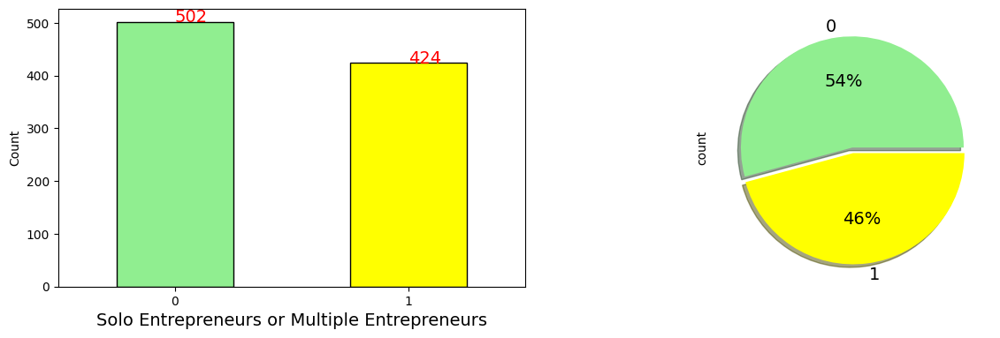

In [75]:
# Solo or multiple Entrepreneurs ?
print(shark_tank['Multiple Entrepreneurs'].value_counts(), "\n")
print(round(shark_tank['Multiple Entrepreneurs'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
shark_tank["Multiple Entrepreneurs"].value_counts().plot(kind='bar', color=["lightgreen","yellow"], ec="k")
plt.xlabel("Solo Entrepreneurs or Multiple Entrepreneurs", size=14)
plt.ylabel("Count")
plt.xticks(rotation=0)
for x,y in enumerate(shark_tank["Multiple Entrepreneurs"].value_counts()):
    plt.annotate(y, (x,y), fontsize=14, color="red")
    
ax2 = plt.subplot(222)
shark_tank["Multiple Entrepreneurs"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["lightgreen","yellow"], shadow=True, fontsize=14)

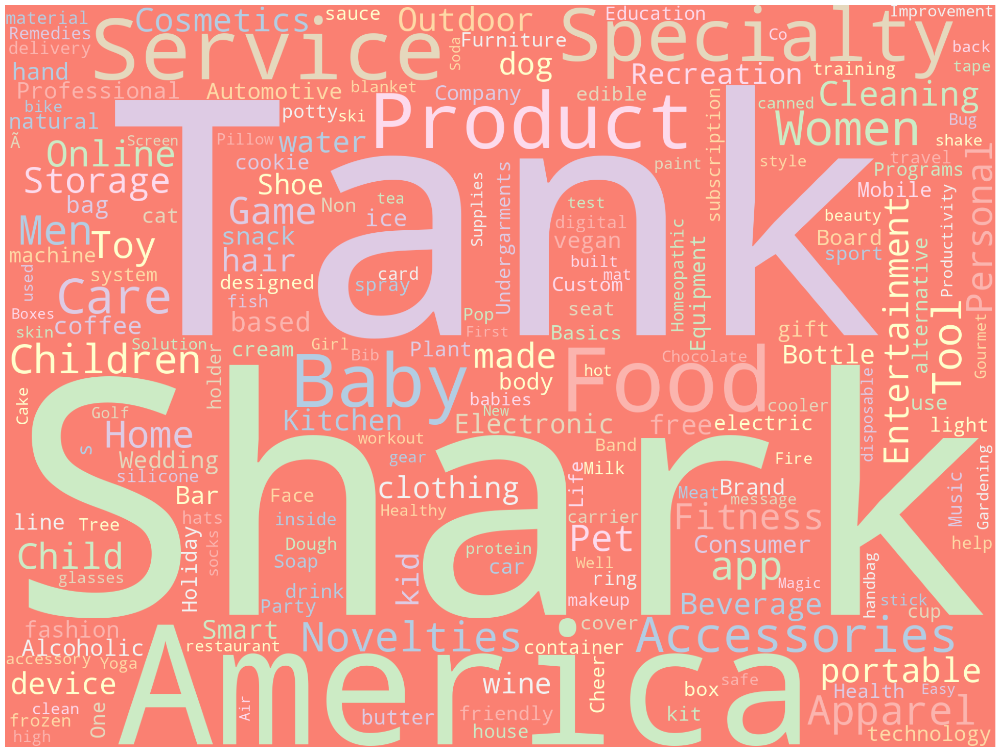

In [76]:
# Word cloud based on Business Description of startups came in all seasons
text = " Shark Tank America ".join(cat for cat in shark_tank.loc[shark_tank['Business Description'].notnull()]['Business Description'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='Pastel1', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [77]:
# Correlation matrix
shark_tank.corr(numeric_only=True).style.background_gradient(cmap = 'Blues')

,Season Number,Episode Number,Pitch Number,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,Investment Amount Per Shark,Equity Per Shark,Royalty Deal,Advisory Shares Equity,Loan,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions
Season Number,1.000000,0.042483,0.995550,0.198696,-0.669914,0.042183,-0.398506,0.188167,0.164312,0.051138,-0.380338,0.143557,-0.034152,0.056914,-0.319781,nan,nan,-0.094471,0.331061,-0.383362,0.011386,-0.315416,0.033306,-0.205250,0.052563,-0.119133,0.081225,-0.228560,0.034272,-0.199625,0.087199,-0.416064,-0.114175,0.488440,0.608364,-0.262179,-0.232579,-0.137834,nan,0.051138
Episode Number,0.042483,1.000000,0.100905,0.046974,0.120268,0.074302,-0.043501,0.047538,0.002757,0.055166,-0.069087,0.027199,-0.108714,0.095818,-0.013139,nan,nan,0.121656,0.094523,-0.116311,0.027231,0.052444,-0.008486,0.018248,0.269527,0.070347,0.029126,0.096641,0.047830,-0.036425,0.052451,-0.138277,-0.081517,0.231817,0.180905,0.018322,-0.097605,-0.034842,nan,0.055166
Pitch Number,0.995550,0.100905,1.000000,0.198176,-0.695383,0.046569,-0.396606,0.192293,0.163165,0.054399,-0.374145,0.145441,-0.041211,0.062629,-0.313214,nan,nan,-0.071004,0.336568,-0.371906,0.017007,-0.313155,0.039735,-0.204225,0.067326,-0.102885,0.087465,-0.215613,0.034657,-0.196465,0.092887,-0.400715,-0.098805,0.431945,0.590457,-0.265341,-0.233065,-0.149592,nan,0.054399
Multiple Entrepreneurs,0.198696,0.046974,0.198176,1.000000,-0.126557,0.030305,-0.136129,0.030371,0.118351,0.045559,-0.148562,0.049972,0.005706,0.058035,-0.145606,nan,nan,0.047477,-0.003956,-0.212714,0.061707,-0.104422,-0.039331,-0.089955,0.057238,-0.088373,0.019161,-0.174270,0.044388,-0.033368,0.054819,-0.147982,0.017102,0.106360,0.119060,-0.001839,-0.055422,-0.021172,nan,0.045559
US Viewership,-0.669914,0.120268,-0.695383,-0.126557,1.000000,-0.015488,0.213096,-0.130110,-0.112410,-0.006809,0.157892,-0.100529,0.023711,-0.015408,0.144435,nan,nan,-0.026280,-0.248225,0.056222,-0.002736,0.193297,-0.070892,0.135217,0.082909,-0.021382,-0.104195,0.045277,0.044351,0.090304,-0.142478,0.019675,-0.110872,0.161871,-0.048159,0.255935,0.004799,0.195927,nan,-0.006809
Original Ask Amount,0.042183,0.074302,0.046569,0.030305,-0.015488,1.000000,-0.131640,0.624777,-0.078094,0.878523,-0.182024,0.622024,-0.001422,0.873259,-0.162844,nan,nan,0.806971,0.715638,-0.290197,0.807918,-0.212780,0.784292,-0.295526,0.972548,0.150595,0.342636,-0.220087,0.916397,-0.231156,0.812239,-0.176615,-0.015451,0.057164,0.015541,-0.075794,-0.001483,-0.027395,nan,0.878523
Original Offered Equity,-0.398506,-0.043501,-0.396606,-0.136129,0.213096,-0.131640,1.000000,-0.406424,-0.107060,-0.153790,0.616510,-0.361423,-0.008996,-0.137294,0.565978,nan,nan,-0.384102,-0.151888,0.376113,-0.235847,0.616645,-0.320045,0.576136,0.253228,0.428339,-0.208019,0.379350,-0.217023,0.479243,-0.291010,0.629613,0.081570,-0.236574,-0.280669,0.152438,0.124930,0.089688,nan,-0.153790
Valuation Requested,0.188167,0.047538,0.192293,0.030371,-0.130110,0.624777,-0.406424,1.000000,-0.034496,0.604676,-0.390869,0.892163,-0.024500,0.580626,-0.349696,nan,nan,0.687921,0.552867,-0.426546,0.680290,-0.333657,0.648787,-0.352579,0.627030,-0.130584,0.354632,-0.277080,0.620266,-0.352544,0.688004,-0.297796,-0.037225,0.110929,0.129378,-0.118035,-0.088158,-0.089672,nan,0.604676
Got Deal,0.164312,0.002757,0.163165,0.11

In [78]:
print("numpy version: {}". format(np.__version__))
print("pandas version: {}". format(pd.__version__))
import matplotlib
print("matplotlib version: {}". format(matplotlib. __version__))
print("seaborn version: {}". format(sns.__version__))
import plotly
print("plotly version: {}". format(plotly.__version__))

# Current Python package versions
# numpy version: 1.26.4
# pandas version: 2.2.1
# matplotlib version: 3.7.5
# seaborn version: 0.12.2
# plotly version: 5.18.0

numpy version: 1.26.4
pandas version: 2.2.1
matplotlib version: 3.7.5
seaborn version: 0.12.2
plotly version: 5.18.0


## Data set values verification (you can ignore below section)
##### below queries should not return any rows

In [79]:
shark_tank.loc[(shark_tank['Got Deal'] == 1) & (shark_tank['Total Deal Amount'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [80]:
shark_tank.loc[(shark_tank['Got Deal'] == 1) & (shark_tank['Total Deal Equity'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [81]:
shark_tank.loc[(shark_tank['Got Deal'] == 1) & (shark_tank['Deal Valuation'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [82]:
shark_tank.loc[(shark_tank['Got Deal'] == 1) & (shark_tank['Number of Sharks in Deal'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [83]:
shark_tank.loc[(shark_tank['Got Deal'] == 1) & (shark_tank['Investment Amount Per Shark'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [84]:
shark_tank.loc[(shark_tank['Got Deal'] == 1) & (shark_tank['Equity Per Shark'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [85]:
shark_tank.loc[round(shark_tank['Total Deal Amount'].fillna(0),1) != round(shark_tank['Barbara Corcoran Investment Amount'].fillna(0) + shark_tank['Mark Cuban Investment Amount'].fillna(0) + shark_tank['Lori Greiner Investment Amount'].fillna(0) + shark_tank['Robert Herjavec Investment Amount'].fillna(0) + shark_tank['Daymond John Investment Amount'].fillna(0) + shark_tank['Kevin O Leary Investment Amount'].fillna(0) + shark_tank['Guest Investment Amount'].fillna(0), 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [86]:
shark_tank.loc[round(shark_tank['Total Deal Equity'].fillna(0),1) != round(shark_tank['Barbara Corcoran Investment Equity'].fillna(0) + shark_tank['Mark Cuban Investment Equity'].fillna(0) + shark_tank['Lori Greiner Investment Equity'].fillna(0) + shark_tank['Robert Herjavec Investment Equity'].fillna(0) + shark_tank['Daymond John Investment Equity'].fillna(0) + shark_tank['Kevin O Leary Investment Equity'].fillna(0) + shark_tank['Guest Investment Equity'].fillna(0), 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [87]:
shark_tank.loc[(shark_tank['Guest Investment Amount'].notnull()) & (shark_tank['Guest Name'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [88]:
shark_tank.loc[(shark_tank['Guest Investment Amount'].isnull()) & (shark_tank['Guest Name'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [89]:
shark_tank.loc[(shark_tank['Multiple Entrepreneurs'] != 0) & (shark_tank['Multiple Entrepreneurs'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [90]:
shark_tank.loc[(shark_tank['Multiple Entrepreneurs'] == 0) & (shark_tank['Entrepreneur Names'].notnull() & shark_tank['Entrepreneur Names'].str.contains(' and'))]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [91]:
shark_tank.loc[(shark_tank['Multiple Entrepreneurs'] == 1) & (shark_tank['Entrepreneur Names'].str.contains(' and ')==False)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions
1345,15,Splash,19,1346,29-Sep-23,NaN,5-Apr-24,Lifestyle/Home,Swim Goggles,https://splashswimgoggles.com/,Female,Goodyear,AZ,Middle,"Ashley Carson, Karen Walker",1,2.96,200000,5.0,4000000,1,200000.0,10.0,2000000.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,200000.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN,1.0,1.0,0.2
1350,15,SorSoap,20,1351,29-Sep-23,NaN,12-Apr-24,Fitness/Sports/Outdoors,Muscle soap,https://www.sorsoap.com/,Male,Brick,NJ,Middle,"David Restiano, Dan Staats",1,NaN,100000,10.0,1000000,1,100000.0,20.0,500000.0,1.0,...,NaN,NaN,NaN,NaN,100000.0,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0,NaN,0.1


In [92]:
shark_tank.loc[(shark_tank['Got Deal'] != 0) & (shark_tank['Got Deal'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [93]:
shark_tank.loc[(shark_tank['Got Deal'] == 0) & (shark_tank['Total Deal Amount'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [94]:
shark_tank.loc[(shark_tank['Pitchers Gender'] == 'Mixed Team') & (shark_tank['Multiple Entrepreneurs'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [95]:
shark_tank.loc[(shark_tank['Got Deal'] == 0) & (shark_tank['Guest Name'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [96]:
shark_tank.loc[shark_tank['Total Deal Amount'] < shark_tank["Loan"]]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions


In [97]:
shark_tank.loc[(shark_tank['Pitchers State'] != 'Non-US') & (shark_tank['Pitchers State'].str.len()>2)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,Pitchers Gender,Pitchers City,Pitchers State,Pitchers Average Age,Entrepreneur Names,Multiple Entrepreneurs,US Viewership,Original Ask Amount,Original Offered Equity,Valuation Requested,Got Deal,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Sharks in Deal,...,Loan,Deal Has Conditions,Barbara Corcoran Investment Amount,Barbara Corcoran Investment Equity,Mark Cuban Investment Amount,Mark Cuban Investment Equity,Lori Greiner Investment Amount,Lori Greiner Investment Equity,Robert Herjavec Investment Amount,Robert Herjavec Investment Equity,Daymond John Investment Amount,Daymond John Investment Equity,Kevin O Leary Investment Amount,Kevin O Leary Investment Equity,Guest Investment Amount,Guest Investment Equity,Guest Name,Barbara Corcoran Present,Mark Cuban Present,Lori Greiner Present,Robert Herjavec Present,Daymond John Present,Kevin O Leary Present,Guest Present,Total Deal Amount in Millions
